In [1]:
"""
统计每日涨停（U）和跌停（D）数量，并捕获读取文件时的错误
"""
import pandas as pd
import os

base_path = r'D:\stock_data\stock'
base_path = os.path.join(base_path, 'OtherData/limit_list')

filename = []
U = []
D = []
error_files = []  # 新增：记录报错文件

for file in os.listdir(base_path):
    if 'limit_list' in file:
        file_path = os.path.join(base_path, file)
        try:
            # 尝试读取文件（注意：如果编码非utf-8，需修改此处）
            try:
                df = pd.read_csv(file_path, encoding='utf-8')
            except UnicodeDecodeError:
                df = pd.read_csv(file_path, encoding='ANSI')

            # 统计涨停跌停数量
            tmp_u = len(df[df['limit'] == 'U'])
            tmp_d = len(df[df['limit'] == 'D'])

            # 记录正常文件数据
            filename.append(file)
            U.append(tmp_u)
            D.append(tmp_d)
        except Exception as e:
            # 捕获异常并记录报错文件
            error_msg = f"Error reading file: {file_path}\n{str(e)}"
            error_files.append(error_msg)
            print(error_msg)  # 实时打印错误

# 定义文件名处理函数
def mysplit(x):
    x = x.split('.')[0]
    x = x.split('_')[-1]
    return x

# 生成结果DataFrame
df_result = pd.DataFrame({
    'file': filename,
    'U': U,
    'D': D
})
df_result['date'] = df_result['file'].apply(mysplit)
df_result = df_result.sort_values('date').reset_index(drop=True)

# 保存结果
df_result.to_csv('limit.csv', index=None)

# 打印所有报错文件（可选）
if error_files:
    print("\n以下文件读取失败：")
    for error in error_files:
        print(error)

In [2]:
###test
"""
标签制作，提前制作好标签，方便后面建模回测
直接运行，会在label文件夹下保存label信息
"""

#import numpy as np
import pandas as pd
import os
import tqdm


max_hold_day = 20  # 最大持股周期
min_profit_rate = 0.12  # 设置未来20天最小盈利点
loss_limit = -0.07 + 0.01  # 设置未来20天的止损点，如果我们止损点是7个点，标数据的时候超过6个点就标记为0

base_path = r'D:\stock_data\stock'
save_base_path = os.path.join(base_path, 'label')
company_info = pd.read_csv(os.path.join(base_path, 'company_info.csv'), encoding='ANSI')
# 丢弃一些多余的信息
# company_info.drop(['index', 'symbol', 'fullname'], axis=1, inplace=True)
#company_info.dropna(inplace=True)

# 读取指数信息
stock_index_info = pd.DataFrame()
tmp_df = pd.read_csv(os.path.join(base_path,  'OldData', 'sh.000001_NormalData.csv'))
print(tmp_df['trade_date'])
if '/' in tmp_df['trade_date'][1]:
    tmp_df['trade_date'] = sorted(
        pd.to_datetime(tmp_df['trade_date'].astype(str).str.strip(), format='%Y/%m/%d')
        .dt.strftime('%Y-%m-%d')
        .unique()
    )
tmp_list = list(tmp_df['trade_date'].sort_values())
date_map = dict(zip(tmp_list, range(len(tmp_list))))
print(tmp_df['trade_date'])

# 读取股票交易信息
stock_info = pd.DataFrame()
remove_stock = []
tmp_list = []
for ts_code in tqdm.tqdm(company_info['ts_code']):
    try:
        tmp_df = pd.read_csv(os.path.join(base_path, 'OldData', ts_code + '_NormalData.csv'))
        tmp_df['ts_code'] = ts_code  # 添加此行：为当前股票数据添加 ts_code 列
        if '/' in tmp_df['trade_date'][1]:
            tmp_df['trade_date'] = (
            pd.to_datetime(tmp_df['trade_date'].astype(str).str.strip(), format='%Y/%m/%d')
            .dt.strftime('%Y-%m-%d')
            .unique()
        )
        #print(tmp_df['trade_date'])
        #print(ts_code)
    except:
        continue
        pass
    # 还需要去除一些停牌时间很久的企业，后期加
    if len(tmp_df) < 100:  # 去除一些上市不久的企业
        remove_stock.append(ts_code)
        continue
    tmp_df = tmp_df.sort_values('trade_date', ascending=True).reset_index(drop=True)

    tmp_list.append(tmp_df)
    #print(tmp_list)

stock_info = pd.concat(tmp_list)
#print(stock_info['ts_code'])

stock_info = stock_info.reset_index(drop=True)

ts_code_map = dict(zip(list(company_info['ts_code']), range(len(company_info))))


stock_info = stock_info.reset_index(drop=True)
#print(stock_info['trade_date'])
stock_info['ts_code_id'] = stock_info['ts_code'].map(ts_code_map)
#print(stock_info['ts_code_id'])
stock_info['trade_date_id'] = stock_info['trade_date'].map(date_map)
#(stock_info['trade_date'])
#print(date_map)
stock_info['ts_date_id'] = (10000 + stock_info['ts_code_id']) * 10000 + stock_info['trade_date_id']
#print(stock_info['ts_date_id'])
stock_info = stock_info.merge(company_info, how='left', on='ts_code')

stock_info = stock_info[['ts_code', 'trade_date', 'ts_date_id', 'high', 'low', 'open']]
print(stock_info['trade_date'])
use_col = []

for i in range(max_hold_day):
    print('begin shift %d days' % (i+1))
    tmp_df = stock_info[['ts_date_id', 'high', 'low']]
    tmp_df = tmp_df.rename(columns={'high':'high_shift_{}'.format(i+1), 'low':'low_shift_{}'.format(i+1)})
    use_col.append('high_shift_{}'.format(i+1))
    use_col.append('low_shift_{}'.format(i+1))
    tmp_df['ts_date_id'] = tmp_df['ts_date_id'] - i - 1

    #print(tmp_df)

    #print(ts_code_map)
    tmp_df = tmp_df.drop_duplicates(subset=['ts_date_id'], keep='first')

    stock_info = stock_info.merge(tmp_df, how='left', on='ts_date_id')

print(stock_info['ts_date_id'])
print(stock_info['trade_date'])
# stock_info.dropna(inplace=True)

# 保存原始索引
original_index = stock_info.index

# 删除缺失值
stock_info_cleaned = stock_info.dropna()

# 获取被删除的行的索引
dropped_indices = original_index.difference(stock_info_cleaned.index)

# 提取被删除的行数据
dropped_rows = stock_info.loc[dropped_indices]

# 检查这些行的缺失列
missing_columns_per_row = dropped_rows.isna().apply(lambda row: row.index[row].tolist(), axis=1)

# 输出结果
for idx, cols in missing_columns_per_row.items():
    print(f"行 {idx} 因列 {cols} 存在缺失值被删除")

print(stock_info['trade_date'])
# 假设以当天开盘价买入
for i in range(max_hold_day):
    stock_info['high_shift_{}'.format(i+1)] = (stock_info['high_shift_{}'.format(i+1)] - stock_info['open']) / stock_info['open']
    stock_info['low_shift_{}'.format(i+1)] = (stock_info['low_shift_{}'.format(i+1)] - stock_info['open']) / stock_info['open']


tmp_array = stock_info[use_col].values

stock_info['label_max'] = 0
stock_info['label_min'] = 0
stock_info['label_final'] = 0
for i in range(max_hold_day):
    # 先判断是否到止损
    tmp_col = 'low_shift_' + str(i + 1)
    idx = stock_info[tmp_col] <= loss_limit
    stock_info.loc[idx, 'label_min'] = 1

    # 再判断是否到最小利润点
    tmp_col = 'high_shift_' + str(i + 1)
    idx = stock_info[tmp_col] >= min_profit_rate
    stock_info.loc[idx, 'label_max'] = 1

    # 如果不到止损点并且 到了最小利润点， 标签为1
    idx = (stock_info['label_min'] == 0) & (stock_info['label_max'] == 1) & (stock_info['label_final'] == 0)
    stock_info.loc[idx, 'label_final'] = 1

    # 如果到了止损点并且 到了最小利润点， 标签为1
    idx = (stock_info['label_min'] == 1) & (stock_info['label_final'] == 0)
    stock_info.loc[idx, 'label_final'] = -1

stock_info['label_final'] = stock_info['label_final'] == 1

# stock_info['label_final'] = (stock_info['label_max'] > 0.1) & (stock_info['label_min'] > -0.06)
stock_info['label_final'] = stock_info['label_final'].apply(lambda x: int(x))

print('the rate of label 1: %.4f' % (stock_info['label_final'].sum() / len(stock_info)))

if not os.path.exists(save_base_path):
    os.mkdir(save_base_path)

save_path = os.path.join(save_base_path, 'label.csv')
print('begin save :' + save_path)
stock_info[['ts_code', 'open', 'trade_date', 'ts_date_id', 'label_final']].to_csv(save_path, index=None)



# 通过未来数据给股票打上二分类标签,是否过于简单?结果是否会有些片面?



0       2018-01-02
1       2018-01-03
2       2018-01-04
3       2018-01-05
4       2018-01-08
           ...    
1955    2026-01-22
1956    2026-01-23
1957    2026-01-26
1958    2026-01-27
1959    2026-01-28
Name: trade_date, Length: 1960, dtype: object
0       2018-01-02
1       2018-01-03
2       2018-01-04
3       2018-01-05
4       2018-01-08
           ...    
1955    2026-01-22
1956    2026-01-23
1957    2026-01-26
1958    2026-01-27
1959    2026-01-28
Name: trade_date, Length: 1960, dtype: object


100%|██████████| 6099/6099 [00:47<00:00, 129.26it/s]


0          2018-01-02
1          2018-01-03
2          2018-01-04
3          2018-01-05
4          2018-01-08
              ...    
9776468    2026-01-22
9776469    2026-01-23
9776470    2026-01-26
9776471    2026-01-27
9776472    2026-01-28
Name: trade_date, Length: 9776473, dtype: object
begin shift 1 days
begin shift 2 days
begin shift 3 days
begin shift 4 days
begin shift 5 days
begin shift 6 days
begin shift 7 days
begin shift 8 days
begin shift 9 days
begin shift 10 days
begin shift 11 days
begin shift 12 days
begin shift 13 days
begin shift 14 days
begin shift 15 days
begin shift 16 days
begin shift 17 days
begin shift 18 days
begin shift 19 days
begin shift 20 days
0          100000000.0
1          100000001.0
2          100000002.0
3          100000003.0
4          100000004.0
              ...     
9776468    160971955.0
9776469    160971956.0
9776470    160971957.0
9776471    160971958.0
9776472    160971959.0
Name: ts_date_id, Length: 9776473, dtype: float64
0          2018

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



the rate of label 1: 0.2542
begin save :D:\stock_data\stock\label\label.csv


In [3]:
# 模型训练
import numpy as np
import pandas as pd
import os
import tqdm
import datetime
import time

# base_path = r'E:\badu\stock'
base_path = 'D:\stock_data\stock'

market_map = {'主板':0, '中小板':1}
exchange_map = {'SZSE':0, 'SSE':1}
is_hs_map = {'S':0, 'N':1, 'H':2}

area_map = {'深圳': 0, '北京': 1, '吉林': 2, '江苏': 3, '辽宁': 4, '广东': 5, '安徽': 6, '四川': 7, '浙江': 8,
            '湖南': 9, '河北': 10, '新疆': 11, '山东': 12, '河南': 13, '山西': 14, '江西': 15, '青海': 16,
            '湖北': 17, '内蒙': 18, '海南': 19, '重庆': 20, '陕西': 21, '福建': 22, '广西': 23, '天津': 24,
            '云南': 25, '贵州': 26, '甘肃': 27, '宁夏': 28, '黑龙江': 29, '上海': 30, '西藏': 31}

industry_map = {'银行': 0, '全国地产': 1, '生物制药': 2, '环境保护': 3, '区域地产': 4, '酒店餐饮': 5, '运输设备': 6,
 '综合类': 7, '建筑工程': 8, '玻璃': 9, '家用电器': 10, '文教休闲': 11, '其他商业': 12, '元器件': 13,
 'IT设备': 14, '其他建材': 15, '汽车服务': 16, '火力发电': 17, '医药商业': 18, '汽车配件': 19, '广告包装': 20,
 '轻工机械': 21, '新型电力': 22, '饲料': 23, '电气设备': 24, '房产服务': 25, '石油加工': 26, '铅锌': 27, '农业综合': 28,
 '批发业': 29, '通信设备': 30, '旅游景点': 31, '港口': 32, '机场': 33, '石油贸易': 34, '空运': 35, '医疗保健': 36,
 '商贸代理': 37, '化学制药': 38, '影视音像': 39, '工程机械': 40, '软件服务': 41, '证券': 42, '化纤': 43, '水泥': 44,
 '专用机械': 45, '供气供热': 46, '农药化肥': 47, '机床制造': 48, '多元金融': 49, '百货': 50, '中成药': 51, '路桥': 52,
 '造纸': 53, '食品': 54, '黄金': 55, '化工原料': 56, '矿物制品': 57, '水运': 58, '日用化工': 59, '机械基件': 60,
 '汽车整车': 61, '煤炭开采': 62, '铁路': 63, '染料涂料': 64, '白酒': 65, '林业': 66, '水务': 67, '水力发电': 68,
 '互联网': 69, '旅游服务': 70, '纺织': 71, '铝': 72, '保险': 73, '园区开发': 74, '小金属': 75, '铜': 76, '普钢': 77,
 '航空': 78, '特种钢': 79, '种植业': 80, '出版业': 81, '焦炭加工': 82, '啤酒': 83, '公路': 84, '超市连锁': 85,
 '钢加工': 86, '渔业': 87, '农用机械': 88, '软饮料': 89, '化工机械': 90, '塑料': 91, '红黄酒': 92, '橡胶': 93, '家居用品': 94,
 '摩托车': 95, '电器仪表': 96, '服饰': 97, '仓储物流': 98, '纺织机械': 99, '电器连锁': 100, '装修装饰': 101, '半导体': 102,
 '电信运营': 103, '石油开采': 104, '乳制品': 105, '商品城': 106, '公共交通': 107, '船舶': 108, '陶瓷': 109}

In [4]:
def JudgeST(x):
    if 'ST' in x:
        return 1
    else:
        return 0
######一定要去除本身就不存在的列,我不确定是哪个文件,检查所有,删除对应一开始就不存在的列,修改对应代码逻辑使其能正常运行
# def GetMA(df, col_name, rolling_day):
#     tmp_array = df[col_name].values.reshape(-1)
#     df.loc[ rolling_day:, col_name + '_'+str(rolling_day)] = (tmp_array[0:-rolling_day] -
#                                                               tmp_array[rolling_day:]) / tmp_array[0:-rolling_day]
#     return df

def GetMA(df, col_name, rolling_day, fill_na=True):
    # 复制 DataFrame 避免修改原始数据
    df = df.copy()

    # 处理缺失值（可选）
    if fill_na:
        df[col_name] = df[col_name].fillna(method='ffill')

    # 获取历史数据（避免未来泄露）
    past_values = df[col_name].shift(rolling_day)

    # 计算变化率并处理除零错误
    new_col = f"{col_name}_{rolling_day}"
    df[new_col] = np.where(
        past_values != 0,
        (df[col_name] - past_values) / past_values,
        np.nan
    )

    # 删除前 rolling_day 行的 NaN（由于 shift 导致）
    df[new_col] = df[new_col].iloc[rolling_day:]

    return df


#getMA方法可能有问题,注意解决

col = ['ma'+str(i) for i in [5, 10, 13, 21, 30]] + ['ma_v_'+str(i) for i in [5, 10, 13, 21, 30]]
#用的什么原始数据????
#用于计算并添加移动平均线列,后续使用其进行分析

company_info = pd.read_csv(os.path.join(base_path, 'company_info.csv'), encoding='ANSI')

#company_info['is_ST'] = company_info['name'].apply(JudgeST)


##xiugai
# 丢弃一些多余的信息
company_info.drop(['symbol'], axis=1, inplace=True)

company_info.dropna(inplace=True)

company_info['market'] = company_info['market'].map(market_map)



##xiugai
company_info['exchange'] = company_info['exchange'].map(exchange_map)
#company_info['is_hs'] = company_info['is_hs'].map(is_hs_map)
print(company_info)

# 读取指数信息
stock_index_info = pd.DataFrame()
# tmp_df = pd.read_csv(os.path.join(base_path,  'OldData', '000001.SH_NormalData.csv'))


tmp_df = pd.read_csv(os.path.join(base_path,  'OldData', 'sh.000001_NormalData.csv'))

if '/' in tmp_df['trade_date'][1]:
    tmp_df['trade_date'] = sorted(
        pd.to_datetime(tmp_df['trade_date'].astype(str).str.strip(), format='%Y/%m/%d')
        .dt.strftime('%Y-%m-%d')
        .unique()
    )
tmp_list = list(tmp_df['trade_date'].sort_values())
date_map = dict(zip(tmp_list, range(len(tmp_list))))

# 读取股票交易信息
stock_info = pd.DataFrame()
remove_stock = []
tmp_list = []

##是前数据获取出现问题,mav系列列本身应该作为输入,重新获取数据,在获取时添加mav的计算逻辑,还有要更换数据时间段,2020到2025或者别的时间段,保留数据时效性
##ma_v是5日成交量的移动平均线,添加计算逻辑即可
for ts_code in tqdm.tqdm(company_info['ts_code']):
    try:
        tmp_df = pd.read_csv(os.path.join(base_path,  'OldData', ts_code + '_NormalData.csv'))
        if '/' in tmp_df['trade_date'][1]:
            tmp_df['trade_date'] = (
            pd.to_datetime(tmp_df['trade_date'].astype(str).str.strip(), format='%Y/%m/%d')
            .dt.strftime('%Y-%m-%d')
            .unique()
        )
        #print(tmp_df)

    except:
        continue
        pass
    # 还需要去除一些停牌时间很久的企业，后期加
    if len(tmp_df) < 100:  # 去除一些上市不久的企业
        remove_stock.append(ts_code)
        continue
    if 'ma5' not in tmp_df.columns:
        continue
    tmp_df = tmp_df.sort_values('trade_date', ascending=True).reset_index(drop=True)
    #print(col)
    for tmp_col in col:
        for rolling_day in [5]:
            #注意到该循环中rolling_day的取值似乎不满足移动平均线的要求,ma要求窗口为5, 10, 13, 21, 30,但此时仅有5一个元素,不知道出于什么原因
            #print("current: ",tmp_col)

            tmp_df = GetMA(tmp_df, tmp_col, rolling_day)

    tmp_list.append(tmp_df)

stock_info = pd.concat(tmp_list)
stock_info = stock_info.reset_index(drop=True)
ts_code_map = dict(zip(list(company_info['ts_code']), range(len(company_info))))


stock_info = stock_info.reset_index(drop=True)
stock_info['ts_code_id'] = stock_info['ts_code'].map(ts_code_map)

stock_info['trade_date_id'] = stock_info['trade_date'].map(date_map)
stock_info['ts_date_id'] = ((10000 + stock_info['ts_code_id']) * 10000 + stock_info['trade_date_id'])
stock_info = stock_info.merge(company_info, how='left', on='ts_code')
stock_info_copy = stock_info.copy()

        ts_code      name  market  exchange   list_date
0     sh.000001    上证综合指数       0         1  1991-07-15
1     sh.000002    上证A股指数       0         1  1992-02-21
2     sh.000003    上证B股指数       0         1  1992-08-17
3     sh.000004   上证工业类指数       0         1  1993-05-03
4     sh.000005   上证商业类指数       0         1  1993-05-03
...         ...       ...     ...       ...         ...
6094  sz.399995  中证基建工程指数       1         0  2015-03-12
6095  sz.399996  中证智能家居指数       1         0  2014-09-17
6096  sz.399997    中证白酒指数       1         0  2015-01-21
6097  sz.399998    中证煤炭指数       1         0  2015-02-13
6098  sh.688785       恒运昌       0         1  2026-01-28

[6099 rows x 5 columns]


  0%|          | 0/6099 [00:00<?, ?it/s]C:\Users\30865\AppData\Local\Temp\ipykernel_14968\3182314221.py:19: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[col_name] = df[col_name].fillna(method='ffill')
C:\Users\30865\AppData\Local\Temp\ipykernel_14968\3182314221.py:19: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[col_name] = df[col_name].fillna(method='ffill')
C:\Users\30865\AppData\Local\Temp\ipykernel_14968\3182314221.py:19: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[col_name] = df[col_name].fillna(method='ffill')
C:\Users\30865\AppData\Local\Temp\ipykernel_14968\3182314221.py:19: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instea

In [5]:

stock_info = stock_info.drop_duplicates(subset=['ts_date_id'])
print(len(stock_info), len(stock_info_copy))

9760384 9768633


In [6]:
print(stock_info_copy['ts_date_id'])
print(stock_info['ts_date_id'])
#print(stock_info_copy['trade_date'][1])

0          100010000.0
1          100010001.0
2          100010002.0
3          100010003.0
4          100010004.0
              ...     
9768628    160971955.0
9768629    160971956.0
9768630    160971957.0
9768631    160971958.0
9768632    160971959.0
Name: ts_date_id, Length: 9768633, dtype: float64
0          100010000.0
1          100010001.0
2          100010002.0
3          100010003.0
4          100010004.0
              ...     
9768628    160971955.0
9768629    160971956.0
9768630    160971957.0
9768631    160971958.0
9768632    160971959.0
Name: ts_date_id, Length: 9760384, dtype: float64


In [7]:
print(stock_info_copy['ts_code'][22866])

sh.000013


In [8]:
# 找到 stock_info_copy 中存在但 stock_info 中不存在的索引
missing_indices = stock_info_copy.index.difference(stock_info.index)

# 通过缺失的索引从原始副本中提取对应的行
missing_rows = stock_info_copy.loc[missing_indices]

# 打印结果
print(len(missing_indices))
print("缺失的索引位置：", missing_indices.tolist())
print("缺失的具体行数据：\n", missing_rows)

8249
缺失的索引位置： [677766, 677767, 677768, 677769, 677770, 677771, 677772, 677773, 677774, 677775, 677776, 677777, 677778, 677779, 677780, 677781, 677782, 677783, 677784, 677785, 677786, 677787, 677788, 677789, 677790, 677791, 677792, 677793, 677794, 677795, 677796, 677797, 677798, 677799, 677800, 677801, 677802, 677803, 677804, 677805, 677806, 677807, 677808, 677809, 677810, 677811, 677812, 677813, 677814, 677815, 677816, 677817, 677818, 677819, 677820, 677821, 677822, 677823, 677824, 677825, 677826, 677827, 677828, 677829, 677830, 677831, 677832, 677833, 677834, 677835, 677836, 677837, 677838, 677839, 677840, 677841, 677842, 677843, 677844, 677845, 677846, 677847, 677848, 677849, 677850, 677851, 677852, 677853, 677854, 677855, 677856, 677857, 677858, 677859, 677860, 677861, 677862, 677863, 677864, 677865, 677866, 677867, 677868, 677869, 677870, 677871, 677872, 677873, 677874, 677875, 677876, 677877, 677878, 677879, 677880, 677881, 677882, 677883, 677884, 677885, 677886, 677887, 677888, 6

In [9]:
all_nan_or_zero = (stock_info_copy.isna().all()) | (stock_info_copy == 0).all()

# 判断是否存在这样的列
has_invalid_columns = all_nan_or_zero.any()

print("是否存在全NaN或全0的列:", has_invalid_columns)

# 可选：列出具体列名
invalid_columns = all_nan_or_zero[all_nan_or_zero].index.tolist()
print("无效的列:", invalid_columns)

是否存在全NaN或全0的列: False
无效的列: []


In [10]:
print(stock_info)

           ts_code  trade_date       open       high        low      close  \
0        sh.000002  2018-01-02  3470.6730  3507.3800  3470.6730  3506.6150   
1        sh.000002  2018-01-03  3506.0030  3539.7510  3503.4130  3528.4270   
2        sh.000002  2018-01-04  3530.4030  3553.3120  3524.4270  3545.7980   
3        sh.000002  2018-01-05  3546.6010  3563.0120  3540.0930  3552.1740   
4        sh.000002  2018-01-08  3551.9600  3574.1570  3544.6100  3570.7530   
...            ...         ...        ...        ...        ...        ...   
9768628  sz.399998  2026-01-22  2046.0428  2093.0578  2041.6036  2087.5929   
9768629  sz.399998  2026-01-23  2086.3430  2086.3430  2065.7607  2072.3677   
9768630  sz.399998  2026-01-26  2069.2308  2116.9538  2066.0445  2112.6602   
9768631  sz.399998  2026-01-27  2106.7292  2116.9000  2056.4020  2059.3536   
9768632  sz.399998  2026-01-28  2063.3093  2165.7876  2056.6235  2147.0546   

         pre_close   change   pct_chg           vol  ...  ma_v_

# 特征工程

In [11]:
feature_col = []#这之后的ts_date等等数据列都有问题,导致生成出来的index列出现问题,主要问题就是date格式区别,记得修改

In [12]:
# 获取月份 和 星期几
def get_weekday(x):
    x = str(x)
    return datetime.datetime.fromtimestamp(time.mktime(time.strptime(x, "%Y-%m-%d"))).weekday()
stock_info['month'] = stock_info['trade_date'].apply(lambda x: int(str(x)[4:6]))
stock_info['weekday'] = stock_info['trade_date'].apply(get_weekday)
feature_col.append('month')
feature_col.append('weekday')

In [13]:
# 添加涨跌停信息
limit_info = pd.read_csv('limit.csv')
limit_info.drop('file', axis=1, inplace=True)
limit_info['U-D'] = limit_info['U'] - limit_info['D']
limit_info = limit_info.rename(columns={'date':'trade_date'})
stock_info = stock_info.merge(limit_info[['U-D', 'trade_date']], on='trade_date', how='left')
feature_col.append('U-D')

In [14]:
# 求相对的vol 这里与10均线比较
stock_info['vol'] = (stock_info['vol'] - stock_info['ma_v_10']) / stock_info['ma_v_10']
feature_col.append('vol')

#转换low colse等
col = ['open', 'high', 'low', 'high', 'pre_close']
for tmp_col in col:
    stock_info[tmp_col+'_transform'] = (stock_info[tmp_col] - stock_info['ma10']) / stock_info['ma10']
    feature_col.append(tmp_col+'_transform')


In [15]:
# 添加大盘指数信息
tmp_df = pd.read_csv(os.path.join(base_path,  'OldData', 'sh.000001' + '_NormalData.csv'))
for tmp_col in ['amount', 'pre_close']:
    tmp_df = tmp_df.rename(columns={tmp_col: tmp_col + '_index_000001'})
    stock_info = stock_info.merge(tmp_df[['trade_date', tmp_col + '_index_000001']], on='trade_date', how='left')

for tmp_col in ['amount_index_000001', 'pre_close_index_000001', 'amount', 'pre_close']:
    print(tmp_col)
    for i in range(5):
        tmp_df = stock_info[['ts_date_id', tmp_col]]
        new_col_name = tmp_col + '_shift_{}'.format(i+1)
        tmp_df = tmp_df.rename(columns={tmp_col:new_col_name})
        feature_col.append(new_col_name)
        tmp_df['ts_date_id'] = tmp_df['ts_date_id'] + i + 1
        stock_info = stock_info.merge(tmp_df, how='left', on='ts_date_id')
    for i in range(5):
        new_col_name = tmp_col + '_shift_{}'.format(i+1)
        stock_info[new_col_name] = (stock_info[tmp_col] - stock_info[new_col_name]) / stock_info[new_col_name]

amount_index_000001
pre_close_index_000001
amount
pre_close


In [16]:
print(len(stock_info), len(stock_info_copy))
stock_info_test = stock_info.copy()

9760384 9768633


In [17]:
feature_col.append('turnover_rate')
print(stock_info.shape)

(9760384, 72)


In [18]:
all_nan_or_zero = (stock_info.isna().all()) | (stock_info == 0).all()

# 判断是否存在这样的列
has_invalid_columns = all_nan_or_zero.any()

print("是否存在全NaN或全0的列:", has_invalid_columns)

# 可选：列出具体列名
invalid_columns = all_nan_or_zero[all_nan_or_zero].index.tolist()
print("无效的列:", invalid_columns)

是否存在全NaN或全0的列: True
无效的列: ['amount_shift_4']


In [19]:
stock_info.columns

Index(['ts_code', 'trade_date', 'open', 'high', 'low', 'close', 'pre_close',
       'change', 'pct_chg', 'vol', 'amount', 'turnover_rate', 'ma5', 'ma_v_5',
       'ma10', 'ma_v_10', 'ma13', 'ma_v_13', 'ma21', 'ma_v_21', 'ma30',
       'ma_v_30', 'ma60', 'ma_v_60', 'ma120', 'ma_v_120', 'ma5_5', 'ma10_5',
       'ma13_5', 'ma21_5', 'ma30_5', 'ma_v_5_5', 'ma_v_10_5', 'ma_v_13_5',
       'ma_v_21_5', 'ma_v_30_5', 'ts_code_id', 'trade_date_id', 'ts_date_id',
       'name', 'market', 'exchange', 'list_date', 'month', 'weekday', 'U-D',
       'open_transform', 'high_transform', 'low_transform',
       'pre_close_transform', 'amount_index_000001', 'pre_close_index_000001',
       'amount_index_000001_shift_1', 'amount_index_000001_shift_2',
       'amount_index_000001_shift_3', 'amount_index_000001_shift_4',
       'amount_index_000001_shift_5', 'pre_close_index_000001_shift_1',
       'pre_close_index_000001_shift_2', 'pre_close_index_000001_shift_3',
       'pre_close_index_000001_shift_4', 

特征需要向前移一天，策略买入是第二天的开盘价，所以当天算出来的特征需要向前平移一天

将特征向前平移一天也可以方便后期给大家推荐股票

设置买入时间为第二天的开盘，买入价格开盘价


In [20]:
stock_info['ts_date_id'] = stock_info['ts_date_id'] + 1
print(stock_info.shape)

(9760384, 72)


# 标签读取

In [21]:
label_path = os.path.join(r'D:\stock_data\stock','label', 'label.csv')
label = pd.read_csv(label_path)
label = label[['ts_code', 'trade_date', 'open', 'ts_date_id', 'label_final']]
print(stock_info.shape)

(9760384, 72)


In [22]:
print(stock_info['trade_date'])
stock_info_1 = stock_info.copy()

0          2018-01-02
1          2018-01-03
2          2018-01-04
3          2018-01-05
4          2018-01-08
              ...    
9760379    2026-01-22
9760380    2026-01-23
9760381    2026-01-26
9760382    2026-01-27
9760383    2026-01-28
Name: trade_date, Length: 9760384, dtype: object


In [23]:
stock_info.drop(['open', 'trade_date', 'ts_code'], axis=1, inplace=True)
stock_info = label.merge(stock_info, on='ts_date_id', how='left')

all_nan_or_zero = (stock_info.isna().all()) | (stock_info == 0).all()

# 判断是否存在这样的列
has_invalid_columns = all_nan_or_zero.any()

print("是否存在全NaN或全0的列:", has_invalid_columns)

# 可选：列出具体列名
invalid_columns = all_nan_or_zero[all_nan_or_zero].index.tolist()
print("无效的列:", invalid_columns)

print(stock_info['trade_date'])

是否存在全NaN或全0的列: True
无效的列: ['amount_shift_4']
0          2018-01-02
1          2018-01-03
2          2018-01-04
3          2018-01-05
4          2018-01-08
              ...    
9776468    2026-01-22
9776469    2026-01-23
9776470    2026-01-26
9776471    2026-01-27
9776472    2026-01-28
Name: trade_date, Length: 9776473, dtype: object


In [24]:
print(stock_info.shape)
stock_info_2 = stock_info.copy()

#stock_info_copy = stock_info

#print(stock_info_copy.shape)

(9776473, 73)


In [25]:
#stock_info_copy = stock_info

In [26]:
#stock_info.dropna(inplace=True)
#print(stock_info.shape)##研究是什么导致了每一行都存在nan或者0值

In [27]:
stock_info = stock_info.reset_index(drop=True)
print(len(stock_info))

9776473


In [28]:
stock_info.head()

,ts_code,trade_date,open,ts_date_id,label_final,high,low,close,pre_close,change,...,amount_shift_1,amount_shift_2,amount_shift_3,amount_shift_4,amount_shift_5,pre_close_shift_1,pre_close_shift_2,pre_close_shift_3,pre_close_shift_4,pre_close_shift_5
0,sh.000001,2018-01-02,3314.030,100000000.0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,sh.000001,2018-01-03,3347.742,100000001.0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,sh.000001,2018-01-04,3371.000,100000002.0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,sh.000001,2018-01-05,3386.464,100000003.0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,sh.000001,2018-01-08,3391.552,100000004.0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
#print(trn_data_idx)

# 模型训练

In [30]:

trn_col = feature_col
# 'high', 'low', 'close', 'pre_close',
trn_col = list(set(trn_col))
label = 'label_final'
# trn_date_min = 20170103
# trn_date_max = 20190416
# val_date_min = 20190417
# val_date_max = 20190429
# test_date_min = 20190417
# test_date_max = 20191218

trn_date_min = 20190101
trn_date_max = 20260123
val_date_min = 20260126
val_date_max = 20260127
test_date_min = 20260128
test_date_max = 20260128
#print(type(stock_info['trade_date'][1]))
stock_info['trade_date'] = stock_info['trade_date'].str.replace("-", "", regex=False).astype(int)
print(stock_info['trade_date'])
trn_data_idx = (stock_info['trade_date'] >= trn_date_min) & (stock_info['trade_date'] <= trn_date_max) & (stock_info['high']!=stock_info['close'])
val_data_idx = (stock_info['trade_date'] >= val_date_min) & (stock_info['trade_date'] <= val_date_max)
test_data_idx = (stock_info['trade_date'] >= test_date_min) & (stock_info['trade_date'] <= test_date_max)

trn = stock_info[trn_data_idx][trn_col]
trn_label = stock_info[trn_data_idx][label].values

val = stock_info[val_data_idx][trn_col]
val_label = stock_info[val_data_idx][label].values 

test = stock_info[test_data_idx][trn_col]
test_label = stock_info[test_data_idx][label].values

0          20180102
1          20180103
2          20180104
3          20180105
4          20180108
             ...   
9776468    20260122
9776469    20260123
9776470    20260126
9776471    20260127
9776472    20260128
Name: trade_date, Length: 9776473, dtype: int32


In [31]:
print(test_data_idx)

0          False
1          False
2          False
3          False
4          False
           ...  
9776468    False
9776469    False
9776470    False
9776471    False
9776472     True
Name: trade_date, Length: 9776473, dtype: bool


In [32]:
print(stock_info[test_data_idx])

           ts_code  trade_date       open   ts_date_id  label_final  \
1959     sh.000001    20260128  4150.2152  100001959.0            0   
3919     sh.000002    20260128  4351.6824  100011959.0            0   
5879     sh.000003    20260128   263.1175  100021959.0            0   
7839     sh.000004    20260128  3928.7079  100031959.0            0   
9799     sh.000005    20260128  2826.2174  100041959.0            0   
...            ...         ...        ...          ...          ...   
9768632  sz.399994    20260128  2026.9852  160931959.0            0   
9770592  sz.399995    20260128  4146.3348  160941959.0            0   
9772552  sz.399996    20260128  5016.3584  160951959.0            0   
9774512  sz.399997    20260128  8309.5361  160961959.0            0   
9776472  sz.399998    20260128  2063.3093  160971959.0            0   

              high        low      close  pre_close    change  ...  \
1959           NaN        NaN        NaN        NaN       NaN  ...   
3919   

In [33]:
print(stock_info[297366:297366 + 957]['trade_date'])

297366    20250328
297367    20250331
297368    20250401
297369    20250402
297370    20250403
            ...   
298318    20210126
298319    20210127
298320    20210128
298321    20210129
298322    20210201
Name: trade_date, Length: 957, dtype: int32


In [34]:
# stock_2rd = stock_info_copy[298987:298987 + 1755].copy()
# stock_2rd.drop(['open', 'trade_date', 'ts_code'], axis=1, inplace=True)
# #stock_2rd = label.merge(stock_2rd, on='ts_date_id', how='left')
#
# all_nan_or_zero = (stock_2rd.isna().all()) | (stock_2rd == 0).all()
#
# # 判断是否存在这样的列
# has_invalid_columns = all_nan_or_zero.any()
#
# print("是否存在全NaN或全0的列:", has_invalid_columns)
#
# # 可选：列出具体列名
# invalid_columns = all_nan_or_zero[all_nan_or_zero].index.tolist()
# print("无效的列:", invalid_columns)

In [35]:
test_date_min = 20260122
test_date_max = 20260123
test_data_idx = (stock_info['trade_date'] >= test_date_min) & (stock_info['trade_date'] <= test_date_max)
test = stock_info[test_data_idx][trn_col]
test_label = stock_info[test_data_idx][label].values

In [36]:
print(test_label)

[0 0 0 ... 0 0 0]


In [37]:
print(trn_data_idx)

0          False
1          False
2          False
3          False
4          False
           ...  
9776468     True
9776469     True
9776470    False
9776471    False
9776472    False
Length: 9776473, dtype: bool


In [38]:
print('rate of 0: %.4f, rate of 1: %.4f' % (np.sum(trn_label==0)/len(trn_label), np.sum(trn_label==1)/len(trn_label)))
print('trn data:%d, val data:%d, test data:%d' % (len(trn), len(val), len(test)))
print('number of features:%d' % len(trn_col))
print(feature_col)

rate of 0: 0.7373, rate of 1: 0.2627
trn data:8334039, val data:11300, test data:11300
number of features:29
['month', 'weekday', 'U-D', 'vol', 'open_transform', 'high_transform', 'low_transform', 'high_transform', 'pre_close_transform', 'amount_index_000001_shift_1', 'amount_index_000001_shift_2', 'amount_index_000001_shift_3', 'amount_index_000001_shift_4', 'amount_index_000001_shift_5', 'pre_close_index_000001_shift_1', 'pre_close_index_000001_shift_2', 'pre_close_index_000001_shift_3', 'pre_close_index_000001_shift_4', 'pre_close_index_000001_shift_5', 'amount_shift_1', 'amount_shift_2', 'amount_shift_3', 'amount_shift_4', 'amount_shift_5', 'pre_close_shift_1', 'pre_close_shift_2', 'pre_close_shift_3', 'pre_close_shift_4', 'pre_close_shift_5', 'turnover_rate']


In [39]:
def win_score_eval(preds, valid_df):
    labels = valid_df.get_label()
    preds = np.round(preds)
    tp = np.sum((preds==1)&(labels==1))
    pp = np.sum(preds==1)
    scores = tp/(pp+0.001) + 2.5*tp - pp
#     preds = np.argmax(preds.reshape(3, -1), axis=0)
#     scores = f1_score(y_true=labels, y_pred=preds, average='macro')
    return 'win', scores, True

In [40]:
print(trn)

         amount_shift_5  pre_close_shift_3  turnover_rate  open_transform  \
243                 NaN                NaN            NaN             NaN   
244                 NaN                NaN            NaN             NaN   
245                 NaN                NaN            NaN             NaN   
246                 NaN                NaN            NaN             NaN   
247                 NaN                NaN            NaN             NaN   
...                 ...                ...            ...             ...   
9776465       -0.157784          -0.024167       0.997062       -0.003857   
9776466       -0.137872          -0.026006       0.947757       -0.019993   
9776467        0.087565          -0.004383       1.081829       -0.011397   
9776468       -0.058587           0.011957       0.903875       -0.000681   
9776469        0.754416           0.010239       1.231160       -0.010188   

         pre_close_index_000001_shift_2  amount_shift_1  low_transform   U-

In [41]:
# 模型训练及评价
import lightgbm as lgb
from sklearn import metrics
from sklearn.metrics import accuracy_score, roc_auc_score
import numpy as np
from tqdm import tqdm  # 导入进度条库

# 添加进度条回调函数
# def progress_bar(max_iter, verbose_eval=None, **kwargs):
#     pbar = tqdm(total=max_iter, desc="Training", unit='round')  # 初始化进度条
#
#     def callback(env):
#         if verbose_eval and (env.iteration % verbose_eval == 0 or env.iteration == max_iter - 1):
#             # 显示评估指标（需确保param中设置了metric）
#             postfix = {}
#             if env.evaluation_result_list:
#                 postfix = {k[1]: f"{v:.4f}" for k, v in env.evaluation_result_list}
#             pbar.set_postfix(**postfix)
#         pbar.update(1)  # 更新进度
#
#         if env.iteration == max_iter - 1:  # 训练结束时关闭进度条
#             pbar.close()
#     callback.order = 50  # 确保在默认回调之后执行
#     return callback
#
# # 参数设置（添加metric以显示评估指标）
# param = {
#     'num_leaves': 31,
#     'min_data_in_leaf': 20,
#     'objective': 'binary',
#     'learning_rate': 0.06,
#     "boosting": "gbdt",
#     "metric": 'binary_logloss',  # 必须设置metric才能显示评估值
#     "verbosity": -1
# }
#
# # 训练数据
# trn_data = lgb.Dataset(trn, trn_label)
# val_data = lgb.Dataset(val, val_label)
#
# # 训练模型（添加回调）
# num_round = 1000
# clf = lgb.train(
#     param,
#     trn_data,
#     num_boost_round=num_round,
#     valid_sets=[trn_data, val_data],  # 添加验证集以显示评估指标
#     callbacks=[
#         progress_bar(max_iter=num_round, verbose_eval=100),  # 每100轮更新评估指标
#         lgb.early_stopping(stopping_rounds=300, verbose=False)  # 可选：静默版早停
#     ],
#     verbose_eval=False  # 关闭默认日志输出
# )
#
# # 预测
# test_lgb = clf.predict(test, num_iteration=clf.best_iteration)






# -------------------- 参数配置 --------------------
param = {
    'num_leaves': 31,
    'min_data_in_leaf': 20,
    'objective': 'binary',  # 二分类任务
    'learning_rate': 0.06,
    "boosting": "gbdt",
    "metric": ["binary_logloss", "auc"],  # 监控logloss和AUC
    "verbosity": 1,  # 允许输出日志
    "seed": 42  # 固定随机种子
}

# -------------------- 回调函数配置 --------------------
# 早停机制（验证集AUC连续100轮不提升则停止）
early_stop = lgb.early_stopping(
    stopping_rounds=200,
    first_metric_only=False,  # 监控所有指标
    verbose=True
)

# 打印日志回调（每50轮输出一次）
log_eval = lgb.log_evaluation(period=100)

# 自定义进度条（需安装tqdm: pip install tqdm）
from tqdm.auto import tqdm

class ProgressBarCallback:
    def __init__(self):
        self.pbar = None
        self.best_score = {}

    def __call__(self, env):
        # 初始化进度条
        if self.pbar is None:
            self.pbar = tqdm(total=env.end_iteration - env.iteration, desc="Training",
             bar_format='{l_bar}{bar}| {n_fmt}/{total_fmt} [剩余:{remaining}]')

        # 更新进度条
        self.pbar.update(1)

        # 记录最佳指标
        # for key, value in env.evaluation_result_list:
        #     if 'auc' in key:  # 以AUC为例
        #         self.best_score[key] = max(self.best_score.get(key, 0), value)

        for entry in env.evaluation_result_list:
            try:
                # 解包四元组: (数据集名称, 指标名称, 指标值, 是否训练集标志)
                dataset_name, metric_name, value, _ = entry

                if metric_name == 'auc':
                    # 构造唯一键 例如: 'train_auc'
                    key = f"{dataset_name}_{metric_name}"

                    # 初始化最佳值为负无穷
                    current_best = self.best_score.get(key, float('-inf'))

                    # 更新最佳值（AUC越大越好）
                    if value > current_best:
                        self.best_score[key] = value
                        # 实时更新进度条描述
                        self.pbar.set_postfix_str(f"Best {key}: {value:.4f}")

            except Exception as e:
                print(f"解析评估条目异常: {entry}, 错误: {str(e)}")
                continue

        # 训练结束时处理
        if env.iteration == env.end_iteration:
            self.pbar.close()
            print("\n最佳AUC记录:")
            for k, v in self.best_score.items():
                print(f"  {k}: {v:.4f}")

# -------------------- 模型训练 --------------------
# 加载数据
trn_data = lgb.Dataset(trn, trn_label)
val_data = lgb.Dataset(val, val_label)

#print(trn)
# 执行训练
clf = lgb.train(
    params=param,
    train_set=trn_data,
    num_boost_round=1000,
    valid_sets=[trn_data, val_data],  # 监控训练集和验证集
    valid_names=['train', 'valid'],   # 命名数据集用于日志区分
    callbacks=[log_eval, ProgressBarCallback()]  # 集成所有回调,early_stop
)

clf.save_model('lgb_model.txt')
# -------------------- 模型评估 --------------------
# 预测验证集
val_pred = clf.predict(val, num_iteration=clf.best_iteration)

# 计算指标
val_pred_label = np.where(val_pred >= 0.5, 1, 0)  # 概率转0/1标签
print(f"\n验证集 AUC: {roc_auc_score(val_label, val_pred):.4f}")
print(f"验证集准确率: {accuracy_score(val_label, val_pred_label):.4f}")

# 测试集预测


[LightGBM] [Info] Number of positive: 2189369, number of negative: 6144670
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.332341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6575
[LightGBM] [Info] Number of data points in the train set: 8334039, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.262702 -> initscore=-1.031972
[LightGBM] [Info] Start training from score -1.031972


Training:   0%|          | 0/1000 [剩余:?]

[100]	train's binary_logloss: 0.519127	train's auc: 0.716972	valid's binary_logloss: 0.379718	valid's auc: 0.72951
[200]	train's binary_logloss: 0.501713	train's auc: 0.743888	valid's binary_logloss: 0.376257	valid's auc: 0.707644
[300]	train's binary_logloss: 0.493328	train's auc: 0.753289	valid's binary_logloss: 0.364317	valid's auc: 0.690807
[400]	train's binary_logloss: 0.488236	train's auc: 0.758587	valid's binary_logloss: 0.364964	valid's auc: 0.686896
[500]	train's binary_logloss: 0.484829	train's auc: 0.761885	valid's binary_logloss: 0.365087	valid's auc: 0.686605
[600]	train's binary_logloss: 0.482322	train's auc: 0.764378	valid's binary_logloss: 0.360573	valid's auc: 0.685175
[700]	train's binary_logloss: 0.480565	train's auc: 0.766179	valid's binary_logloss: 0.356744	valid's auc: 0.681167
[800]	train's binary_logloss: 0.478985	train's auc: 0.767796	valid's binary_logloss: 0.35675	valid's auc: 0.680578
[900]	train's binary_logloss: 0.477667	train's auc: 0.76926	valid's binary

In [42]:
# test_date_min = 20250301
# test_date_max = 20250401
# test_data_idx = (stock_info['trade_date'] >= test_date_min) & (stock_info['trade_date'] <= test_date_max)
# test = stock_info[test_data_idx][trn_col]
# test_label = stock_info[test_data_idx][label].values
# print(stock_info['trade_date'])


In [43]:
stock_info_test['trade_date'] = stock_info_test['trade_date'].str.replace("-", "", regex=False).astype(int)

In [44]:
##try!!!
test_date_min = 20260126
test_date_max = 20260128
test_data_idx = (stock_info_test['trade_date'] >= test_date_min) & (stock_info_test['trade_date'] <= test_date_max)
test = stock_info_test[test_data_idx][trn_col]
#test_label = stock_info_test[test_data_idx][label].values
print(stock_info_test['trade_date'])
#print(test.col)


0          20180102
1          20180103
2          20180104
3          20180105
4          20180108
             ...   
9760379    20260122
9760380    20260123
9760381    20260126
9760382    20260127
9760383    20260128
Name: trade_date, Length: 9760384, dtype: int32


In [45]:
print(len(stock_info_test))
print(stock_info_test[:8546069]['trade_date'])
test.head()

9760384
0          20180102
1          20180103
2          20180104
3          20180105
4          20180108
             ...   
8546064    20240902
8546065    20240903
8546066    20240904
8546067    20240905
8546068    20240906
Name: trade_date, Length: 8546069, dtype: int32


,amount_shift_5,pre_close_shift_3,turnover_rate,open_transform,pre_close_index_000001_shift_2,amount_shift_1,low_transform,U-D,amount_index_000001_shift_3,vol,...,pre_close_shift_4,month,amount_shift_4,amount_index_000001_shift_5,amount_index_000001_shift_1,pre_close_index_000001_shift_1,amount_shift_3,amount_index_000001_shift_2,amount_shift_2,amount_index_000001_shift_4
1957,0.219923,0.005438,1.856639,0.005619,0.004670,0.086132,0.000745,28.0,0.230197,0.147500,...,0.005360,0,NaN,0.219909,0.086025,0.003296,0.230180,0.208107,0.208499,0.188602
1958,0.055637,0.003775,1.580396,0.000844,0.002433,-0.111841,-0.004819,30.0,0.072950,-0.009255,...,0.004573,0,NaN,0.055626,-0.111875,-0.000860,0.073339,-0.035475,-0.035343,0.092568
1959,0.157074,0.004200,1.724175,0.006312,0.000904,0.059015,0.003355,68.0,0.021445,0.098713,...,0.005553,0,NaN,0.157045,0.059013,0.001766,0.021586,-0.059464,-0.059427,0.136268
3917,0.380025,0.015740,0.326657,0.014270,0.004670,0.356938,0.011080,28.0,0.230197,0.064275,...,0.014693,0,NaN,0.219909,0.086025,0.003296,0.228536,0.208107,0.389071,0.188602
3918,0.470214,0.010046,0.285343,0.010802,0.002433,-0.182176,0.000828,30.0,0.072950,-0.043908,...,0.016156,0,NaN,0.055626,-0.111875,-0.000860,0.136016,-0.035475,0.109737,0.092568


In [46]:
print(test_data_idx)

0          False
1          False
2          False
3          False
4          False
           ...  
9760379    False
9760380    False
9760381     True
9760382     True
9760383     True
Name: trade_date, Length: 9760384, dtype: bool


In [47]:
loaded_model = lgb.Booster(model_file='lgb_model.txt')
test_lgb = loaded_model.predict(test, num_iteration=clf.best_iteration)

In [48]:
print(len(test_lgb))
print(test_lgb)


16927
[0.08210663 0.07683613 0.09018833 ... 0.23379902 0.18573884 0.36720128]


In [54]:


# Step 1: 将预测label与test索引对齐
threshold = 0.49
test_lgb_bool = (test_lgb >= threshold).astype(int)  # 转换为整数型0/1
# -------------------------------------------------
# 获取预测为1的样本在test中的原始索引
predicted_1_mask = (test_lgb_bool == 1)  # 生成布尔掩码
original_indices = test.index[predicted_1_mask]  # 保留原始索引

# Step 2: 从完整数据集中提取对应样本
# -------------------------------------------------
# 根据原始索引定位完整数据
selected_samples = stock_info_test.loc[original_indices]

# Step 3: 提取ts_code字段并去重
# -------------------------------------------------
# 直接提取ts_code列并转换为数据结构（自动去重）
ts_code_list = selected_samples['ts_code'].unique().tolist()  # 列表形式
# ts_code_series = selected_samples['ts_code'].drop_duplicates()  # Series形式

# 输出结果
print(f"预测为1的样本数量: {len(ts_code_list)}")
print("对应的ts_code列表:\n", ts_code_list)
print("asdadadasdasd")

# 可选：保存结果到文件
# selected_samples.to_csv("predicted_1_samples.csv", columns=['ts_code'])

预测为1的样本数量: 5
对应的ts_code列表:
 ['sh.600191', 'sh.605090', 'sh.688486', 'sz.300147', 'sz.300849']
asdadadasdasd


LSTM预测股票走势,或者查看知乎收藏

In [50]:
pd.DataFrame({
        'column': trn_col,
        'importance': clf.feature_importance(),
    }).sort_values(by='importance', ascending=False)

,column,importance
7,U-D,2478
14,pre_close_index_000001_shift_5,2157
22,amount_index_000001_shift_5,2088
4,pre_close_index_000001_shift_2,2061
23,amount_index_000001_shift_1,1950
26,amount_index_000001_shift_2,1943
8,amount_index_000001_shift_3,1918
28,amount_index_000001_shift_4,1917
10,pre_close_index_000001_shift_4,1715
24,pre_close_index_000001_shift_1,1711


# 模型评价

In [51]:
from sklearn import metrics

# oof_lgb_final = np.round(oof_lgb)
# print(metrics.accuracy_score(val_label, oof_lgb_final))
# print(metrics.confusion_matrix(val_label, oof_lgb_final))
# tp = np.sum(((oof_lgb_final == 1) & (val_label == 1)))
# pp = np.sum(oof_lgb_final == 1)
# print('sensitivity:%.3f'% (tp/(pp)))


val_pred = clf.predict(val, num_iteration=clf.best_iteration)  # 原始预测变量名是val_pred

# -------------------- 评估指标计算 --------------------
# 将概率四舍五入为0/1标签
oof_lgb_final = np.round(val_pred)  # 使用val_pred变量

print(f"验证集准确率: {metrics.accuracy_score(val_label, oof_lgb_final):.4f}")
print("混淆矩阵:\n", metrics.confusion_matrix(val_label, oof_lgb_final))

# 计算灵敏度（召回率）
tp = np.sum((oof_lgb_final == 1) & (val_label == 1))  # 真阳性
pp = np.sum(oof_lgb_final == 1)                       # 预测阳性总数
sensitivity = tp / pp if pp > 0 else 0.0               # 避免除以零
print(f'灵敏度(Sensitivity): {sensitivity:.3f}')

# 更规范的召回率计算（推荐使用sklearn内置函数）
from sklearn.metrics import recall_score
print(f'召回率(Recall): {recall_score(val_label, oof_lgb_final):.3f}')

验证集准确率: 0.9656
混淆矩阵:
 [[10911     0]
 [  389     0]]
灵敏度(Sensitivity): 0.000
召回率(Recall): 0.000


In [52]:
from sklearn import metrics

thresh_hold = 0.5
# oof_test_final = (test_lgb >= 0.69) & (test_lgb <=0.7)
oof_test_final = test_lgb >= thresh_hold
print(metrics.accuracy_score(test_label, oof_test_final))
print(metrics.confusion_matrix(test_label, oof_test_final))
tp = np.sum(((oof_test_final == 1) & (test_label == 1)))
pp = np.sum(oof_test_final == 1)
print('accuracy:%.3f'% (tp/(pp)))

ValueError: Found input variables with inconsistent numbers of samples: [11300, 16927]

In [72]:
test_postive_idx = np.argwhere(oof_test_final == 1).reshape(-1)
# test_postive_idx = list(range(len(oof_test_final)))
test_all_idx = np.argwhere(test_data_idx).reshape(-1)

In [37]:
print()

In [135]:
# 查看选了哪些股票
# tmp_col = ['ts_code', 'name', 'trade_date', 'open', 'high', 'low', 'close', 'pre_close',
#        'change', 'pct_chg', 'amount', 'is_ST', 'label_final']


tmp_col = ['ts_code', 'name', 'trade_date', 'open', 'high', 'low', 'close', 'pre_close',
       'change', 'pct_chg', 'amount', 'label_final']
# stock_info.iloc[test_all_idx[test_postive_idx]]

tmp_df = stock_info[tmp_col].iloc[test_all_idx[test_postive_idx]].reset_index()
tmp_df['label_prob'] = test_lgb[test_postive_idx]
# idx_tmp = tmp_df['is_ST'] == 0
# tmp_df.loc[idx_tmp, 'is_limit_up'] = (((tmp_df['close'][idx_tmp]-tmp_df['pre_close'][idx_tmp]) / tmp_df['pre_close'][idx_tmp]) > 0.095)
# idx_tmp = tmp_df['is_ST'] == 1
# tmp_df.loc[idx_tmp, 'is_limit_up'] = (((tmp_df['close'][idx_tmp]-tmp_df['pre_close'][idx_tmp]) / tmp_df['pre_close'][idx_tmp]) > 0.047)

tmp_df['is_limit_up'] = tmp_df['close'] == tmp_df['high']

buy_df = tmp_df[(tmp_df['is_limit_up']==False)].reset_index()
buy_df.drop(['index', 'level_0'], axis=1, inplace=True)

IndexError: index 11200 is out of bounds for axis 0 with size 11188

In [74]:
print(len(buy_df), sum(buy_df['label_final']))

1761 708


# 回测

In [75]:
# stock_info.reset_index().head()
# 读取指数信息
index_df = pd.read_csv(os.path.join(base_path,  'OldData', 'sh.000001' + '_NormalData.csv'))
index_df['trade_date'] = index_df['trade_date'].str.replace("-", "", regex=False).astype(int)
tmp_idx = (index_df['trade_date'] >= test_date_min) & (index_df['trade_date'] <= test_date_max)
index_df = index_df.loc[tmp_idx].reset_index()
index_df.drop('index', axis=1, inplace=True)

In [76]:

print(tmp_idx)

0       False
1       False
2       False
3       False
4       False
        ...  
1752     True
1753     True
1754     True
1755     True
1756     True
Name: trade_date, Length: 1757, dtype: bool


In [77]:
if test_date_min+1 in index_df['trade_date'].tolist():
    tmp_idx = (index_df['trade_date'] == test_date_min+1)
    print("1")
elif test_date_min+2 in index_df['trade_date'].tolist():
    tmp_idx = (index_df['trade_date'] == test_date_min+2)
    print("2")
elif test_date_min+3 in index_df['trade_date'].tolist():
    tmp_idx = (index_df['trade_date'] == test_date_min+3)
    print("3")
print(tmp_idx)
close1 = index_df[tmp_idx]['close'].values[0]
tmp_idx = (index_df['trade_date'] == test_date_max)
close2 = index_df[tmp_idx]['close'].values[0]

1
0      True
1     False
2     False
3     False
4     False
5     False
6     False
7     False
8     False
9     False
10    False
11    False
12    False
13    False
14    False
15    False
16    False
17    False
18    False
19    False
20    False
21    False
22    False
23    False
24    False
25    False
26    False
27    False
28    False
29    False
30    False
31    False
32    False
33    False
34    False
35    False
36    False
37    False
38    False
39    False
40    False
41    False
42    False
43    False
44    False
45    False
46    False
47    False
48    False
49    False
50    False
51    False
52    False
53    False
54    False
55    False
56    False
57    False
Name: trade_date, dtype: bool


In [78]:
print(buy_df)

        ts_code          name  trade_date       open       high        low  \
0     sh.000111         380信息    20250109  7125.4512  7200.0854  6889.9839   
1     sh.000131          上证高新    20250109  2330.8320  2376.2598  2265.4750   
2     sh.000137    上证380高贝塔指数    20250109  4023.6007  4076.3727  3904.9729   
3     sh.600053          九鼎投资    20250109    13.2100    13.4600    12.9000   
4     sh.600066          宇通客车    20250210    26.8600    27.3500    26.0000   
...         ...           ...         ...        ...        ...        ...   
1756  sz.399363  国证算力基础设施主题指数    20250109  5045.3935  5113.7246  4900.6091   
1757  sz.399418    国证数据要素主题指数    20250109  3445.0707  3496.6902  3358.0176   
1758  sz.399628     深证700成长指数    20250109  1739.8999  1765.0714  1694.7286   
1759  sz.399688    深成电信业务行业指数    20250210  2511.9270  2533.8511  2426.7313   
1760  sz.399996      中证智能家居指数    20250109  3243.9823  3277.1578  3136.5669   

          close  pre_close   change   pct_chg        amount  la

In [79]:
from imp import reload
import Account
reload(Account)
money_init = 100000
account = Account.Account(money_init, max_hold_period=20, stop_loss_rate=-0.07, stop_profit_rate=0.12)
account.BackTest(buy_df, stock_info_copy, index_df, buy_price='open')

day_info   ==  [20250102 20250103 20250106 20250107 20250108 20250109 20250110 20250113
 20250114 20250115 20250116 20250117 20250120 20250121 20250122 20250123
 20250124 20250127 20250205 20250206 20250207 20250210 20250211 20250212
 20250213 20250214 20250217 20250218 20250219 20250220 20250221 20250224
 20250225 20250226 20250227 20250228 20250303 20250304 20250305 20250306
 20250307 20250310 20250311 20250312 20250313 20250314 20250317 20250318
 20250319 20250320 20250321 20250324 20250325 20250326 20250327 20250328
 20250331 20250401]
20250109  买入 鼎泰高科 (sz.301377) 1000股，股价：19.96,花费：19960.0,手续费：5.99，剩余现金：80034.01
20250109  买入 哈焊华通 (sz.301137) 1100股，股价：16.67,花费：18337.0,手续费：5.5，剩余现金：61691.51
20250109  买入 杭钢股份 (sh.600126) 4400股，股价：4.5,花费：19800.0,手续费：5.94，剩余现金：41885.57
20250109  买入 禾信仪器 (sh.688622) 300股，股价：58.8,花费：17640.0,手续费：5.29，剩余现金：24240.28
20250109  买入 扬电科技 (sz.301012) 800股，股价：24.68,花费：19744.0,手续费：5.92，剩余现金：4490.36
20250110  止盈卖出鼎泰高科 (sz.301377) 1000股，股价：25.76,收入：25760.0,手续费：33.49

In [80]:
tmp_df2 = buy_df[['ts_code', 'trade_date', 'label_prob', 'label_final']]
tmp_df2 = tmp_df2.rename(columns={'trade_date':'buy_date'})
tmp_df = account.info
tmp_df = tmp_df.merge(tmp_df2, on=['ts_code', 'buy_date'], how='left')

In [81]:
tmp_df

,ts_code,name,buy_price,buy_date,buy_num,sell_price,sell_date,profit,label_prob,label_final
0,sz.301377,鼎泰高科,19.96,20250109,1000,25.76,20250110,5760.524,0.629580,1
1,sz.301137,哈焊华通,16.67,20250109,1100,17.14,20250213,486.9887,0.622277,0
2,sh.600126,杭钢股份,4.5,20250109,4400,5.11,20250127,2648.8308,0.617907,1
3,sh.688622,禾信仪器,58.8,20250109,300,65.856,20250122,2085.82416,0.617861,0
4,sz.301012,扬电科技,24.68,20250109,800,22.7056,20250113,-1609.057024,0.617237,0
5,sz.301101,明月镜片,38.93,20250115,500,43.6016,20250205,2301.61946,0.544571,1
6,sz.000913,钱江摩托,17.35,20250115,1200,19.432,20250122,2461.84008,0.527445,1
7,sz.300824,北鼎股份,9.0,20250115,800,9.03,20250219,6.776,0.525946,0
8,sh.688800,瑞可达,65.3,20250210,300,60.076,20250217,-1596.50664,0.700610,0
9,sz.300476,胜宏科技,50.0,20250210,400,56.0,20250211,2364.88,0.677020,1


改造一下,让其可以在真实数据中使用
目前首要任务是实现每日数据增量,全量运行时间实在太久,olddata,otherdata,limitdata增量,训练目前还是保持全量训练

1:实时根据每天的数据进行决策,只给出决策列表即可
注意到选股只与训练数据与需要进行选股的当日数据有关,因此可以实现即日训练即日选股(是否考虑不要将选股当日数据纳入训练数据中)

1.1:如何获取每日数据??获取a日数据,a日给出a+1日决策可行?需要了解其决策代码底层原理

1.2:尝试更换为LSTM模型,更正:通过LGB来选股,通过LSTM量化预测次日即更远未来走向

1.3:使用大模型api和新闻爬虫实现影响因子参与预测未来市场走向

1.4:每天获取新数据,每日训练一次lgb模型给出每日决策??

1.5:设置账户总金额止盈率

1.6:经测试lgb仅用来选股,仍需要LSTM实时监测未来走向

1.7:研究怎么优化lgb选股效果,数据驱动?囊括尽可能多的市场类型时间段?如何拼接不同类型时间段?直接拉长时间范围?

1.8:修改data下载和数据处理代码,实现每日自动更新数据

2:给出按天为最小决策单位的决策

3:每日数据分析等等等


In [83]:
account_profit = (account.market_value - money_init) / money_init
index_profit = (close2 - close1) / close1
win_rate = account.victory / (account.victory + account.defeat)
print('账户盈利情况:%.4f' % account_profit)
print('上证指数浮动情况:%.4f' % index_profit)
print('交易胜率:%.4f' % win_rate)
print('最大回撤率:%.4f' % account.max_retracement)

账户盈利情况:0.1784
上证指数浮动情况:0.0263
交易胜率:0.7692
最大回撤率:0.0287


In [84]:
print(len(index_value))
print(account.market_value_all)

NameError: name 'index_value' is not defined

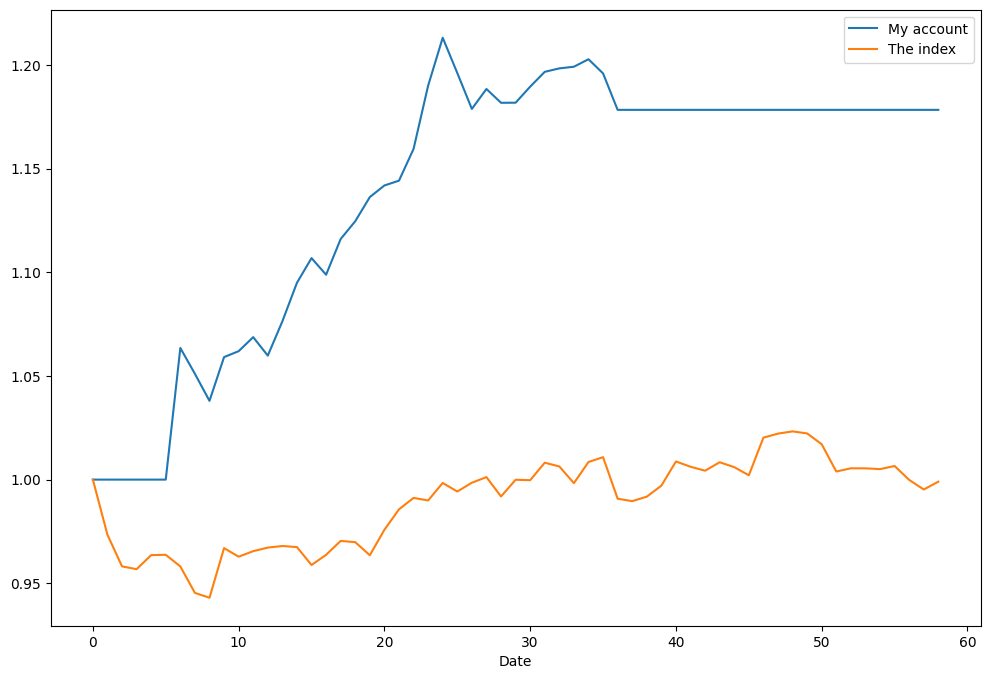

In [85]:
import Draw
import mplfinance as mpf
reload(Draw)
%matplotlib inline
index_value = list(index_df[index_df['trade_date']==test_date_min+1]['pre_close']) + list(index_df.sort_values('trade_date')['close'])
Draw.Draw_Market_Value_Change(0, account.market_value_all, index_value)

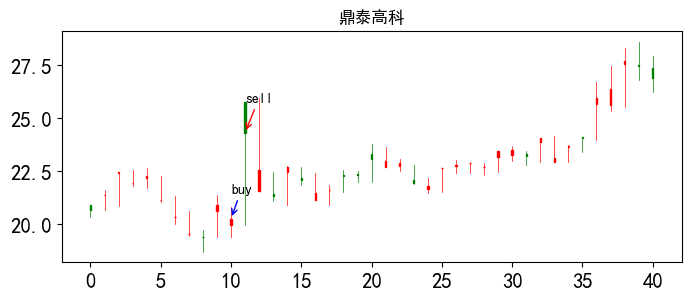

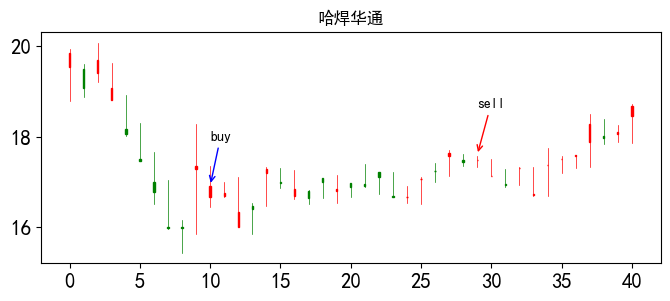

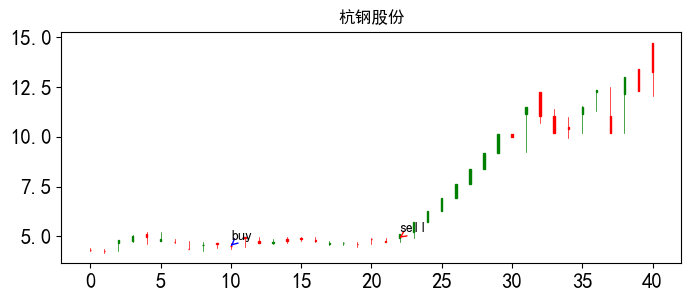

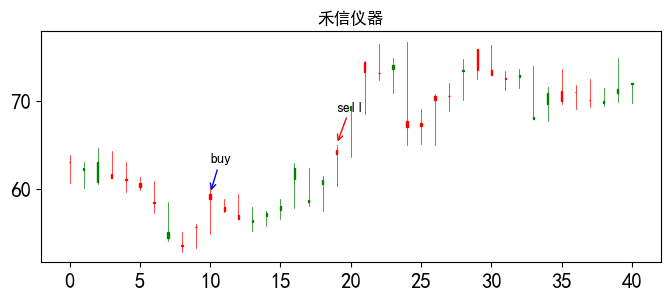

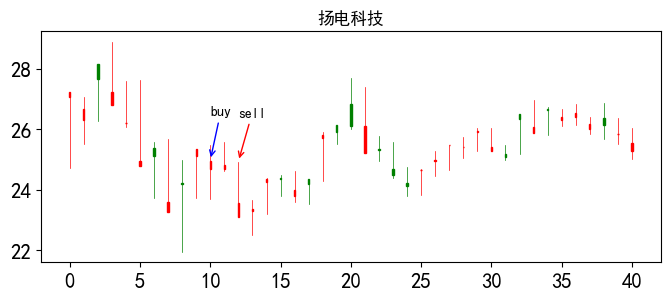

...

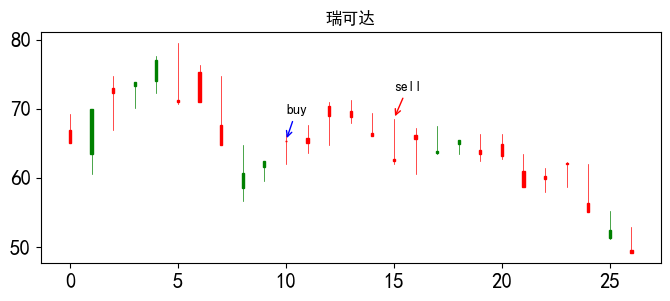

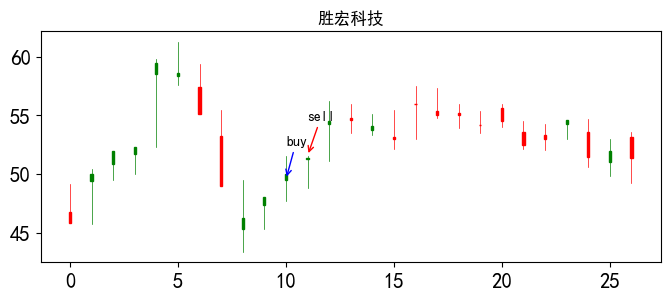

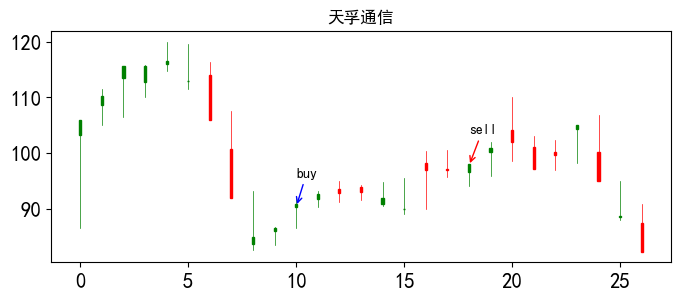

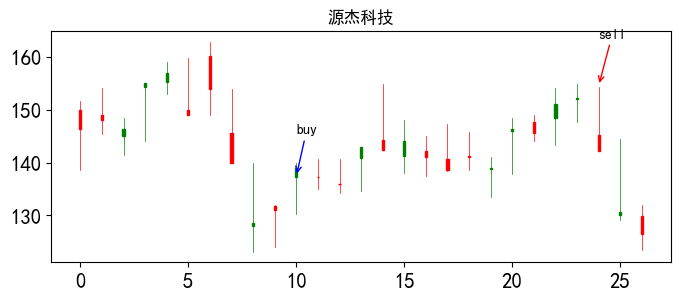

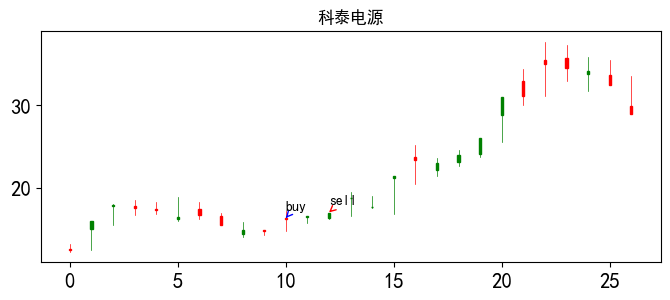

In [86]:
num = 0
for ts_code, buy_date, sell_date in zip(account.info['ts_code'], account.info['buy_date'], account.info['sell_date']):
    Draw.Draw_Stock(ts_code, stock_info, buy_date, sell_date, left_offset=10, right_offset=30)
    num = num + 1
    if num > 60:
         break